# ESFS example workflow - Human glioblastomas
In this workflow we apply ESFS to early human glioblastoma spatial transcriptomics data. We show that ESFS allows us to identify transcriptional programs that exist across tumours from different patients as well as genes that identify spaitial restricted micro-environments in individual tumours.


In [1]:
### Data path
path = "/Users/radleya/The Francis Crick Dropbox/BriscoeJ/Radleya/ESFS_Paper/Paper_Submission/Data/Ravi2022_Human_Glioblastoma/"


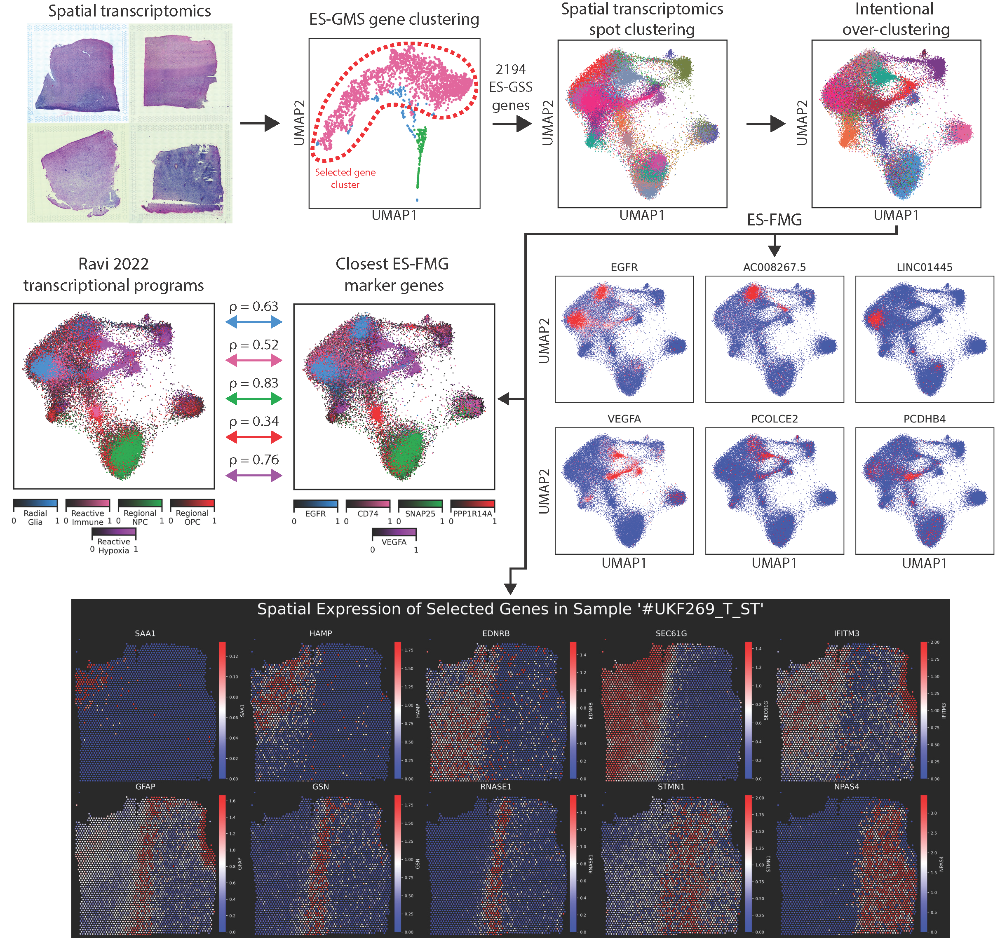

In [2]:
from IPython.display import Image, display
display(Image(filename=path+"Workflow_Image.png"))

### Import ESFS package

In [3]:
import esfs

/opt/anaconda3/envs/ESFS_Env/lib/python3.11/site-packages/esfs/backend.py:45: UserWarning: CuPy is not installed. ESFS will run on CPU, which may be slower for large datasets.
  warnings.warn(


### Import additional packages

In [4]:
import plotly.express as px
from scipy.sparse import csc_matrix
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import FuncNorm
from matplotlib.cm import get_cmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.stats import pearsonr
from matplotlib import colors as mcolors
from matplotlib.colors import to_rgba
from matplotlib.gridspec import GridSpec

### Set python default discrete class colour palette to one with more colours

In [5]:
Colours = px.colors.qualitative.Dark24
Colours.remove('#222A2A') # Remove black form the color palette (personal preference).
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=Colours)

### Load human glioblastoma spatial transcriptomics data and sample info

In [6]:
adata = ad.read_h5ad(path+"ES_adata.h5ad")

### Basic quality control
With the origionally compiled data we performed basic counts normalisation and scaling with the below functions.

The motivation behind this normalisation was to reduce differences in sequencing depth/batch effects between samples
from different datasets.

In this workflow we have loaded the normalised data directly, so skip these lines, but leave them here for prosperity.

In [ ]:
# sc.pp.normalize_total(adata,target_sum=1e4,exclude_highly_expressed=True)
# sc.pp.scale(adata, max_value=10, zero_center=False)

### Create and save a scaled version of the scRNA-seq counts matrix
Create and save a scaled version of the scRNA-seq counts matrix where each genes has their observed expression values clipped if above a percentile threshold (default=97.5) and are then normalised by their maximum values so that all values are between 0-1, which is a requirment for the Entropy Sort Score (ESS) and Error Potential (EP) calcualtions.

In [7]:
adata = esfs.create_scaled_matrix(adata)

### Calculate ESS and EP matricies
Here we use the theory of Entropy Sorting to generate a pairwise gene correlation matrix (ESS matrix) and a correlation significance matrix (EP matrix). To speed up calculations parallel processing is implemented. To control the number of cores used for processing, vary the "Use_Cores" parameter which deaults to "Use_Cores=-1" which indicates the software will use n-1 cores, where n is the number of cores available on your machine. 
Please note that "Use_Cores=-1" is as special flag and "Use_Cores=-2" will not use n-2 cores. You should instead change "Use_Cores" to positive integer values of the number of cores you would like to use.

In [8]:
adata = esfs.parallel_calc_es_matrices(adata, secondary_features_label="Self", save_matrices=np.array(["ESSs","EPs"]), use_cores=-1)

Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'use_cores' parameter as you may have hit a memory ceiling for your machine.


100%|██████████| 17134/17134 [31:50<00:00,  8.97it/s]


ESSs for Self label have been saved to 'adata.varm['Self_ESSs']'
EPs for Self label have been saved to 'adata.varm['Self_EPs']'


### Remove potential batch effect genes 
The human glioblastoma data used in this example contains samples from multiple tumours/patients. A common step for improving donwstream data interprobility of transcriptomics data is to apply batch correction methods such as data integration. However, these methods have the potential of introducing computational aretefacts and obsfucating or removing gene expression patterns of interest. As such, mitigating the requirement of batch correction methods such as data integration can improve downstream analysis.

In the ESFS workflow, we note that batch effects may simply be an over-representation of a set of genes in a specific dataset. As such, we find that simply removing genes that are enriched specifically in one dataset is sufficient to remove signficant batch effects from downstream analysis, without needing to smooth or augment the scRNA-seq counts matrix.

To acheive this, we use the "Parallel_Calc_ES_Matricies" ESFS function to calculate the ESSs and EPs for each gene with regards to the "Dataset" labels provided in the meta data.

In [9]:
Secondary_Features_Label = "Dataset_Secondary_Features"
Leiden_Clusts_Secondary_Features = csc_matrix(pd.get_dummies(adata.obs['sample']).astype("f"))
adata.obsm[Secondary_Features_Label] = Leiden_Clusts_Secondary_Features

adata = esfs.parallel_calc_es_matrices(adata, secondary_features_label=Secondary_Features_Label, save_matrices=np.array(["ESSs","SGs"]), use_cores=-1)

Exclude_Batch_Effect_Genes = np.asarray(adata.var_names[np.where(adata.varm['Dataset_Secondary_Features_ESSs'] > 0.01)[0]])
Exclude_Batch_Effect_Genes.shape

You have provided a 'secondary_features_label', implying that in the anndata object there is a corresponding csc_sparse martix object with rows as samples and columns as features. Each feature will be used to calculate ES scores for each of the variables of the adata object
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'use_cores' parameter as you may have hit a memory ceiling for your machine.


100%|██████████| 15/15 [00:01<00:00, 11.90it/s]

ESSs for Dataset_Secondary_Features label have been saved to 'adata.varm['Dataset_Secondary_Features_ESSs']'
SGs for Dataset_Secondary_Features label have been saved to 'adata.varm['Dataset_Secondary_Features_SGs']'


(6270,)

### Calculate gene importance rankings
We now calculate the gene importance weights and hence gene importance rankings for the remaining genes in the dataset. For further details see our manuscript.

In [10]:
### An array of known important genes for early human embryo development so that we may use them as a
# reference point for how genes are beign ranked/grouped. Replace these genes with those you are
# interested in in your data.
Known_Important_Genes = np.array(['PSPH','LANCL2','S100A8','PTPRZ1','EGFR','PTN','KCNIP1','HAMP','CXCL10','SPP1','MDK','C1QB','B2M','S100A16','HOPX','TUBB2B','BST2','OXTR','ID3','HLA-C','CD63','IL1RAP','ACSS3','ITGAV','IFITM3','SPRED1','TAP1','GNG5','TXNIP','GAP43','SERPING1','GLDC','RARRES3','TUBB6','ISG15','ANXA2','CD151','TFRC','HLA-B','HTRA1','SRGN','H3F3B','HLA-E','SELENON','METRN','HINT1','DAG1','LPL','S100A10','IFI27','CLPTM1L','GBP1','AP2M1','EIF1','DNAJC6','CHGA','COX7A1','FBXL16','PGAM1','MEG3','LOXL2','CD74','C3','CCL3','APLNR','CCL4','HLA-DRA','CRYAB','EFEMP1','HLA-DPA1','PTGDS','FTL','CCL4L2','HLA-DRB1','IGFBP7','AZGP1','THY1','HSPA6','CCDC127','SDHA','PDCD6','MARCH6','HPCA','SYN2','SNAP25','RTN1','STMN2','TMEM130','SYT1','ATP1A3','SYN1','NSG2','LY6H','VSNL1','CHGB','YWHAH','ENC1','CRYM','BASP1','SNCG','NELL2','KCNK1','PLD3','YWHAZ','TUBB2A','SNCA','PTPRN','UCHL1','STXBP1','BEX1','ATP6V1G2','MOAP1','TMEM59L','VAMP2','BEX2','PREPL','SERINC1','KLC1','MAP2K1','NSF','NPTN','NDRG4','YWHAG','ATP6V1A','ATP1B1','ARPP19','MT2A','SCD','OLIG1','MBP','NCAN','PLP1','FABP7','ANXA5','SDC3','SELENOP','FXYD6','TF','PFN2','CNP','Sep-03','JUNB','MEST','SNHG12','PPP3CA','NAPB','HLA-A','ATP1B2','MRC2','PLIN2','G0S2','ADM','VEGFA','HILPDA','ZNF395','ECE1','SULF2','IGFBP5','EPAS1','CA12','SLC6A6','GAPDH','SMIM3','MT1X','DDIT4','TPI1','AKAP12','SLC2A1','IGFBP2','LGALS3','LDHA','CD9','PKM','OLFM1','LOX','MT3','ARRDC3','PLOD2','PYGL','ARL4C','CEBPD','FAM162A','NDRG1','P4HA1','PGK1','SLC2A3','ENO2','GADD45B','VIM','ADAMTS9','HSP90B1','CHPF','FAM20C','Sep-09','PRDX2','HSPA8','PFKP','PXYLP1','TRIM9','OAZ1','NUPR1','SLC3A2','RAB13','CALR','BNIP3','MXRA7','HMOX1','PPDPF','AK5','FAIM2','LY6E','HSPH1','TUBB4A','ANK2','SH3BGRL3','HSPB1','LGALS3BP','STMN1','BEX3','NDUFA4','PHYHIP','ATP5MD','HSPA1B','MLLT11','ATP6V1E1','RAMP1','CCL2','MDH1'])

### Run the ES_Rank_Genes function while using "Exclude_Genes=Exclude_Batch_Effect_Genes" to exclude possible
# batch effect genes and "Known_Important_Genes=Known_Important_Genes" as reference point genes.
adata = esfs.ES_rank_genes(adata,known_important_genes=Known_Important_Genes,exclude_genes=Exclude_Batch_Effect_Genes)

Pruning ESS graph by removing genes with with low numbers of edges (min_edges = 5)
Starting genes = 17134
Remaining genes = 4035
Remaining genes = 3568
Remaining genes = 3550
Remaining genes = 3547
Calculating feature weights
Known inportant gene ranks:
      PSPH  LANCL2  S100A8  PTPRZ1  EGFR  PTN  KCNIP1  HAMP  CXCL10  SPP1  \
Rank   NaN     NaN     NaN     NaN   NaN  NaN     NaN   NaN     NaN   NaN   

      ...  BEX3  NDUFA4  PHYHIP  ATP5MD  HSPA1B  MLLT11  ATP6V1E1  RAMP1  \
Rank  ...   795     NaN     NaN     NaN     NaN     NaN       NaN    NaN   

      CCL2  MDH1  
Rank   NaN   NaN  

[1 rows x 228 columns]
ESFS gene weights have been saved to 'adata.var['ESFS_Gene_Weights']'
ESFS gene ranks have been saved to 'adata.var['ES_Rank']'


### Visualise clustering of top ranked genes in a UMAP generated from their pairwise ESS scores

Visualising the ESS graph of the top 3500 ranked genes in a UMAP.
Clustering == 'hdbscan', set Clustering to an integer value for automated Kmeans clustering.
This function outputs the 'Top_ESS_Genes', 'Gene_Clust_Labels' and 'Gene_Embedding' objects in case users would like to investigate them further.


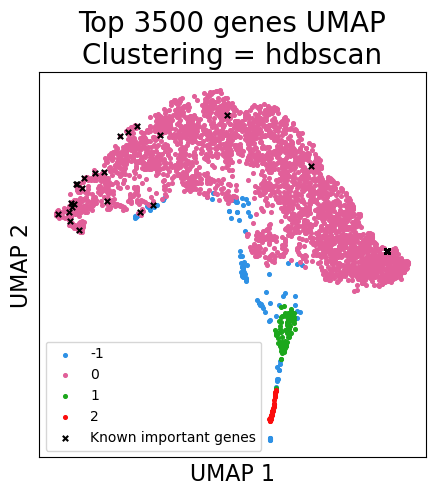

In [11]:
### Visualise top ranked genes graph
# Num_Top_Ranked_Genes is the second of the two paramaters that users should focus on when optimising
# the ESFS workflow for their data. Values between 3000-4000 are a typically good place to start.
Num_Top_Ranked_Genes = 3500

# The "Clustering" paramter can be set to an integer value if you wish to cluster genes in the UMAP with Kmeans clustering.
# Set "Clustering='hdbscan'" for automated density based clustering, and "Clustering=None" for no clustering.
Top_ESS_Genes, Gene_Clust_Labels, Gene_Embedding = esfs.plot_top_ranked_genes_UMAP(adata,Num_Top_Ranked_Genes,clustering="hdbscan",known_important_genes=Known_Important_Genes)
plt.show()

### Visualise the cell clustering UMAPs for each of the groupings of genes identified in the previous step

This is stage of the worfklow is a critical step for trying out different input parameters to try and optimise the final results. The 2 main paramters to vary are the "Num_Top_Ranked_Genes" and the "Clustering" inputs for the Plot_Top_Ranked_Genes_UMAP function.

In breif, you are seeking a gene cluster or combination of gene cluster that reveal biological structure of interest by excluding clusters of genes that contribute a large amount of noise to downstream analysis.

In [12]:
### Get the cell UMAPs for each cluster of genes identified via the Plot_Top_Ranked_Genes_UMAP function.
# n_neighbors: Number of nearest neighbours and min_dist paramaters used for each cell UMAP.
# log_transformed: Determines whether the counts matrix is log2 transcformed (True) or not (False) before generating UMAPs.
# metric: The distance metric used for cell UMAP creation. Default is "correlation" 
# and we highly recommend "correlation" or "cosine", but you may try others.
Gene_Cluster_Embeddings, Gene_Cluster_Selected_Genes = esfs.get_gene_cluster_cell_UMAPs(adata,Gene_Clust_Labels,Top_ESS_Genes,n_neighbors=50,min_dist=0.1,log_transformed=True)

Generating the cell UMAP embeddings for each cluster of genes from the previous function.
Plotting cell UMAP using gene cluster -1
Plotting cell UMAP using gene cluster 0
Plotting cell UMAP using gene cluster 1
Plotting cell UMAP using gene cluster 2


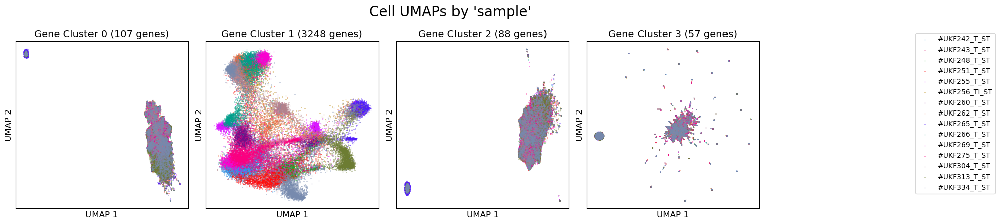

In [14]:
# Plot the cell UMAPs for each gene cluster.
esfs.plot_gene_cluster_cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,cell_label="sample",
    ncol=4,figsize=(18, 4.5),marker_size=0.1,log2_gene_expression=True)
plt.show()

/opt/anaconda3/envs/ESFS_Env/lib/python3.11/site-packages/esfs/plotting.py:450: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


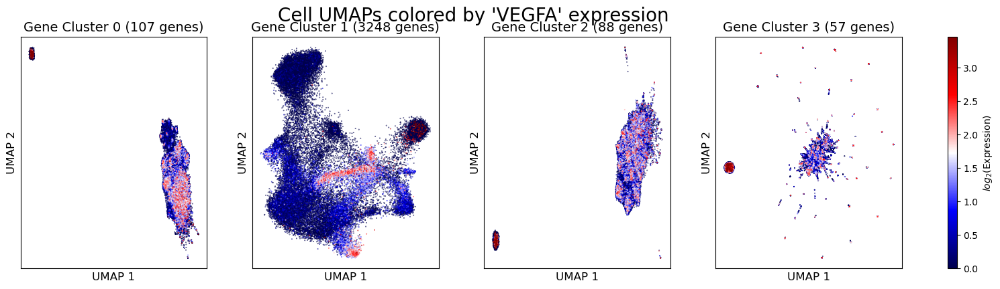

In [15]:
# Plot the cell UMAPs for each gene cluster.
esfs.plot_gene_cluster_cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,cell_label="VEGFA",
    ncol=4,figsize=(18, 4.5),marker_size=0.1,log2_gene_expression=True)
plt.show()


### If you'd like to generate the cell UMAP for a specific cluster of a combination or clusters, use the specific_cluster parameter

For this workflow we find cluster 1 to be produce the most distinct and informative UMAP, so we use "specific_cluster=[1]".

In [16]:
Gene_Cluster_Embeddings, Gene_Cluster_Selected_Genes = esfs.get_gene_cluster_cell_UMAPs(adata,Gene_Clust_Labels,Top_ESS_Genes,specific_cluster=[0],n_neighbors=50,min_dist=0.1,log_transformed=True)

Generating the cell UMAP embeddings for each cluster of genes from the previous function.
Plotting cell UMAP using gene cluster [0]


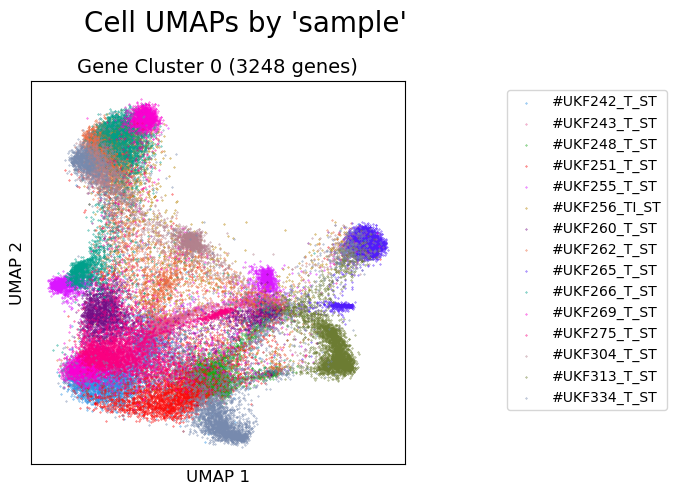

In [17]:
# Plot the cell UMAPs for each gene cluster.
esfs.plot_gene_cluster_cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,cell_label="sample",
    ncol=1,figsize=(5, 5),marker_size=0.1,log2_gene_expression=True)
plt.show()

/opt/anaconda3/envs/ESFS_Env/lib/python3.11/site-packages/esfs/plotting.py:450: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


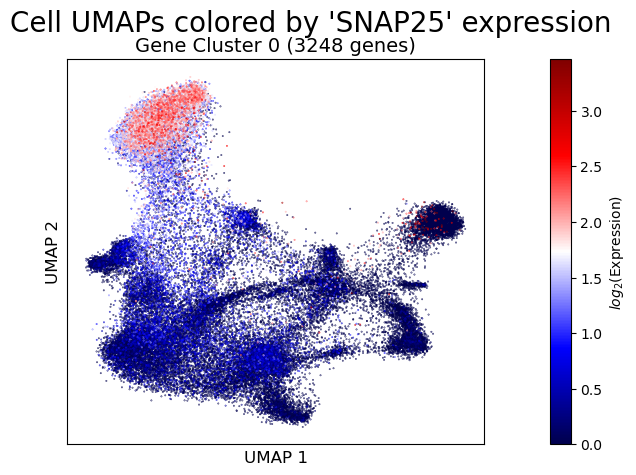

In [18]:
# Plot the cell UMAPs for each gene cluster.
esfs.plot_gene_cluster_cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,cell_label="SNAP25",
    ncol=1,figsize=(6.5, 5),marker_size=0.1,log2_gene_expression=True)
plt.show()

In [19]:
# Retain ES-GSS selected genes and resuting cel UMAP embedding
ES_GSS_Genes = Gene_Cluster_Selected_Genes[0].copy()
ES_UMAP_Embedding = Gene_Cluster_Embeddings[0].copy()

In [20]:
## For plotting, we often use the kNN smoothed expression. Using this function we can get the smoothed counts
# matrix according to the cell neighbourhoods in the gene expression space, sub-setted to the ES_GSS_Genes
adata = esfs.knn_smooth_gene_expression(adata, ES_GSS_Genes, knn=50, metric='correlation', log_scale=False)

Computing batched correlation distances for 47999 cells, batch size = 1000
Smoothing expression matrix using mean over 50 neighbors...


### ES Marker Gene Selection

Having identified a set of genes that improves cell type seperation, we will use the use the Entropy Sorting Combinatorial Cluster Finder (ES-CCF) and Entropy Sorting Find Marker Gene (ES-FMG) algorithms to find a small set of marker genes that are optimised to capture distinct cell states.

In [21]:
## First we subset the data to the ES_GMS_Genes genes and use the sc.pp.neighbors function to calculate the distance
# and neighbourhood arrays.
sub_adata = adata[:, ES_GSS_Genes].copy()
# Some Scanpy functions are slower on sparse matricies so we turn the sparse counts matrix into a dense one.
sub_adata.X = np.log2(sub_adata.X.A+1)
# n_pcs is set to 0 so the gene expression counts are used rather than latent principal components.
sc.pp.neighbors(sub_adata, n_neighbors=50, n_pcs=0, metric="correlation")
# Obtain UMAP co-ordinates
sc.tl.umap(sub_adata,min_dist=0.1)

/var/folders/r9/cmjg8gtj47xd5r03cdvsq6wr0000gp/T/ipykernel_34111/2764384637.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(sub_adata,resolution = 3)


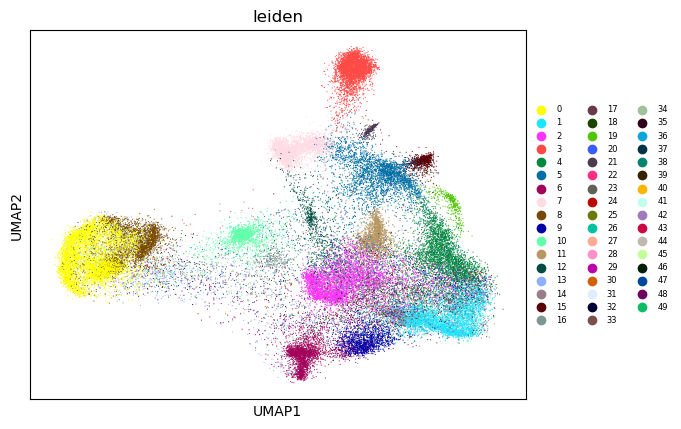

In [22]:
## Run leiden clustering with a relitively high resolution paramater to intentionally over-cluster the cells.
sc.tl.leiden(sub_adata,resolution = 3)
# Visualise the clustering
sc.pl.umap(sub_adata, color=['leiden'],legend_fontsize=6)

In [23]:
## Extract the cluster labels and add them to the adata object
Leiden_Clusts = np.asarray(sub_adata.obs['leiden'])
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
sample_labels = "Leiden_Clusts"
adata.obs[sample_labels] = Leiden_Clusts

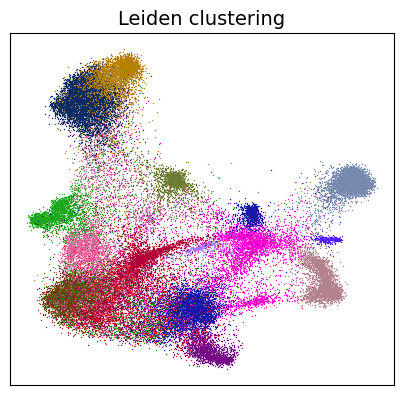

In [24]:
## Sometimes randomly shuffling the Unique_Leiden_Clusts IDs before plotting (to change cluster label colours)
# can help us better visualise the over-clustering.
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
np.random.shuffle(Unique_Leiden_Clusts)

plt.figure(figsize=(4,4))
plt.title("Leiden clustering",fontsize=14)
for i in np.arange(Unique_Leiden_Clusts.shape[0]):
    Inds = np.where(Leiden_Clusts == Unique_Leiden_Clusts[i])[0]
    plt.scatter(ES_UMAP_Embedding[Inds,0],ES_UMAP_Embedding[Inds,1],s=1,linewidths=0)

plt.xticks([])
plt.yticks([]) 
#
plt.subplots_adjust(0.02,0.02,0.98,0.9)

# Re-set the Unique_Leiden_Clusts labels
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
plt.show()

Now we use the Leiden clusters as the input for ES-CCF to identify sets of samples/cells that maximise the correlation of each feature/gene in adata object.

By default the esfs.Parallel_Calc_ES_Matricies function calculates ES metrics of each feature in adata against each feature in adata (pairwise). However, esfs.Parallel_Calc_ES_Matricies may also be provided a set of "Secondary_Features", where each of these Secondary_Features will have ES metrics calculated pairwise against each feature in the adata object. Hence we refer to the Leiden cluster labels as secondary features.

In [25]:
# The Secondary_Features_Label will be used as a prefix to save resulting ES metrics to the adata object.
Secondary_Features_Label = "Clusts_Secondary_Features"
# Using the pd.get_dummies function we convert the Leiden_Clusts vector into a one-hot representation where each 
# unique label becomes it's own feature of 0's and 1's.
Leiden_Clusts_Secondary_Features = csc_matrix(pd.get_dummies(Leiden_Clusts).astype("f"))
adata.obsm[Secondary_Features_Label] = Leiden_Clusts_Secondary_Features

We use Parallel_Calc_ES_Matricies to calculate the required metrics for ES combinatorial marker gene identification (save_matrices=np.array(["ESSs","SGs"])). 
Secondary_Features_Label designates a prefix for saving the ESS and SG outputs.

In [26]:
adata = esfs.parallel_calc_es_matrices(adata, secondary_features_label=Secondary_Features_Label, save_matrices=np.array(["ESSs","SGs"]), use_cores=-1)

You have provided a 'secondary_features_label', implying that in the anndata object there is a corresponding csc_sparse martix object with rows as samples and columns as features. Each feature will be used to calculate ES scores for each of the variables of the adata object
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'use_cores' parameter as you may have hit a memory ceiling for your machine.


100%|██████████| 50/50 [00:06<00:00,  8.10it/s]


ESSs for Clusts_Secondary_Features label have been saved to 'adata.varm['Clusts_Secondary_Features_ESSs']'
SGs for Clusts_Secondary_Features label have been saved to 'adata.varm['Clusts_Secondary_Features_SGs']'


With the ESS and SG matricies saved to adata, we can use the ES_CCF function to identify which combination of Leiden Clusters maximises the correlation (ESS) or each feature/gene in adata. The main output of ES_CCF is a 2D array where each row is the samples of adata and each column is a feature representing the identified combination of Leiden Clusters that maximises the ESS score of the respective feature/gene column in adata.

The ES_CCF function prints where the ES_CCF outputs are saved in the adata object.

In [27]:
adata = esfs.ES_CCF(adata,Secondary_Features_Label)

Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'use_cores' parameter as you may have hit a memory ceiling for your machine.


100%|██████████| 17134/17134 [01:58<00:00, 144.40it/s]


Max combinatorial ESSs for given sample labels has been saved as 'adata.varm['Clusts_Secondary_Features_Max_Combinatorial_ESSs']'
The features/clusters relating to each max_ESS have been saved in 'adata.obsm['Clusts_Secondary_Features_Max_ESS_Features']'


#### Visualise Max ESS clusters
With the below script, you may select a gene and visualise the corresponding Max ESS cluster identified by the ES-CCF algorithm as maximally correlating/enriching the genes expression values in a group samples.

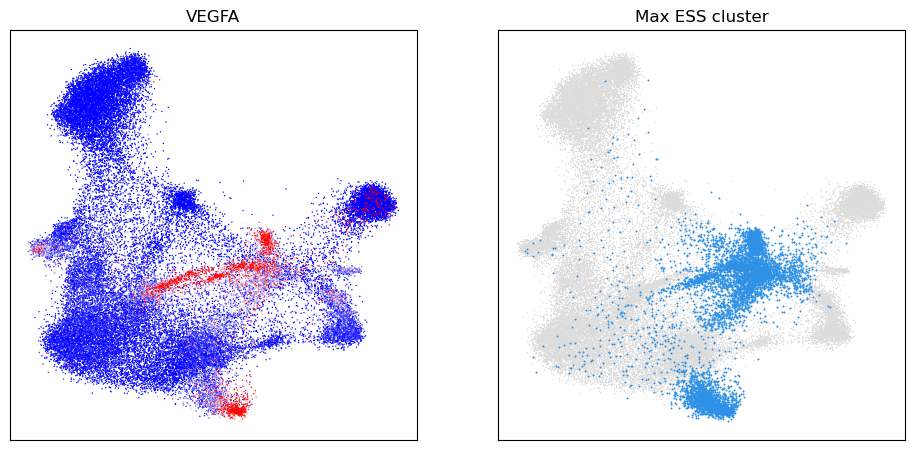

In [28]:
###
Gene = "VEGFA" # "SNAP25", "COL3A1", "LINC01445"
###
Gene_Ind = np.where(adata.var_names == Gene)[0]
Inds = np.where(adata.obsm['Clusts_Secondary_Features_Max_ESS_Features'][:,Gene_Ind].A == 1)[0]
plt.figure(figsize=(4.66*2,2.33*2))
plt.subplot(1,2,1)
plt.title(Gene,fontsize=12)
Exp = np.asarray(adata[:,Gene].X.A).ravel()
Exp = np.clip(Exp,a_min=0,a_max=np.percentile(Exp,97.5))
Order = np.argsort(Exp)
plt.scatter(ES_UMAP_Embedding[Order,0],ES_UMAP_Embedding[Order,1],c=Exp[Order],s=1,cmap="bwr",linewidths=0)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.title("Max ESS cluster",fontsize=12)
plt.scatter(ES_UMAP_Embedding[:,0],ES_UMAP_Embedding[:,1],s=1,c="gainsboro",linewidths=0)
plt.scatter(ES_UMAP_Embedding[Inds,0],ES_UMAP_Embedding[Inds,1],s=2,linewidths=0)
plt.xticks([])
plt.yticks([])
#
plt.subplots_adjust(0.02,0.02,0.98,0.9)

plt.show()

The 2D array of combined Leiden Clusters that maximise adata feature/gene ESSs is then used by Parallel_Calc_ES_Matricies as set of secondary features to obtain the ESS scores of each feature/gene in adata against each identified structure maximising feature. This creates a 2D pairwise adata feature/gene Vs coarse grain combined Leiden Cluster correlation matrix.

Plainly, we obtain a correlation matrix that quantifies how well each gene correlates to the ES-CCF optimised clusters for each gene. These correlations act as a proxy for where are best enriched in the combinatorial cluster space of the intentionally over-clustered data.

In [29]:
Secondary_Features_Label = "Clusts_Secondary_Features_Max_ESS_Features"
adata = esfs.parallel_calc_es_matrices(adata, secondary_features_label=Secondary_Features_Label, save_matrices=np.array(["ESSs"]), use_cores=-1)

You have provided a 'secondary_features_label', implying that in the anndata object there is a corresponding csc_sparse martix object with rows as samples and columns as features. Each feature will be used to calculate ES scores for each of the variables of the adata object
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'use_cores' parameter as you may have hit a memory ceiling for your machine.


100%|██████████| 17134/17134 [39:24<00:00,  7.24it/s] 


ESSs for Clusts_Secondary_Features_Max_ESS_Features label have been saved to 'adata.varm['Clusts_Secondary_Features_Max_ESS_Features_ESSs']'


### ES-FMG
Now that we have a coarse grain represenation of where gene structure is maximised in different regions of the data, we can use esfs.ES_FMG to identify a minimal set of clusters/genes that captures that most unique/non-overlapping structure in the data. This minimal gene set may be thought of as an optimised set of unsuperised marker genes.

In [30]:
Num_Genes = 200
Chosen_Clusters, Chosen_Genes, Chosen_Pairwise_ESSs = esfs.ES_FMG(adata,Num_Genes,Secondary_Features_Label,resolution=1)

Cores Available: 16
Cores Used: 15
Current highest score: 0.3299071067045306
Current highest score: 0.4990772933726827
Current highest score: 0.6776924246883586
Current highest score: 0.8266991238816213
Current highest score: 0.9652133956953883
Current highest score: 1.0463008338519173
Current highest score: 1.121328489366114
Current highest score: 1.1683472819766068
Current highest score: 1.2091260441960017
Current highest score: 1.2478634510884072
Current highest score: 1.2862273154233308
Current highest score: 1.3368633734585071
Current highest score: 1.37453868037025
Current highest score: 1.4118532525773797
Current highest score: 1.4482301862391642
Current highest score: 1.4839820400422479
Current highest score: 1.518092252577967
Current highest score: 1.5503067140574665
Current highest score: 1.5794030293290189
Current highest score: 1.6064386666686465
Current highest score: 1.6601264406528795
Current highest score: 1.685489141345463
Current highest score: 1.7094021498250371
Curr

ES-FMG produces 3 outputs:
 
Chosen_Genes - The optimised set of N marker genes.

Chosen_Clusters - The Max ESS cluster indicies. Subsetting all adata genes to the Chosen_Clusters inds should yeild the same output as Chosen_Genes (adata.var_names[Chosen_Clusters]).

Chosen_Pairwise_ESSs - A pairwise matrix of the Chosen genes and their ESSs with the corresponding Max ESS clusters. The diadonal of this matrix is the ESS of the given marker gene with its Max ESS cluster.

#### Data visualisation
Now that we have a set of optimised marker genes, we may visualise and interpret the results. Below is a simple script to visualise expression in the UMAP space.

We recommend saving plots for each of the ES-FMG "Chosen_Genes" and inspecting them to visualise where the optimised set of marker genes capture different populations of samples.

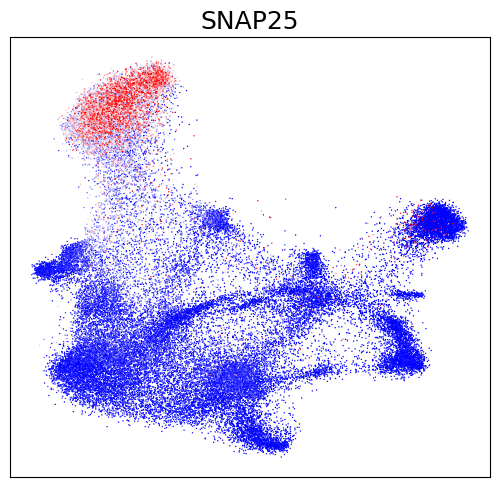

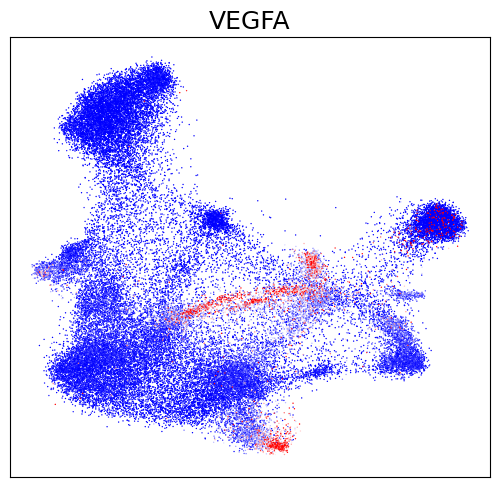

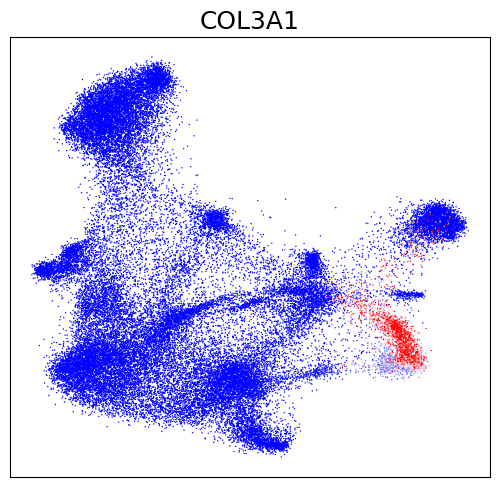

In [31]:
###
Plot_Genes = np.array(["SNAP25","VEGFA","COL3A1"])
###

###
# plot_save_path = "" Edit and uncomment to set the save path for plots
# Plot_Genes = Chosen_Genes.copy()
###

for i in np.arange(Plot_Genes.shape[0]):
    Gene = Plot_Genes[i]
    plt.figure(figsize=(5,5))
    #
    plt.title(Gene,fontsize=18)
    Exp = np.asarray(adata[:,Gene].X.A).ravel()
    Exp = np.clip(Exp,a_min=0,a_max=np.percentile(Exp,99))
    Order = np.argsort(Exp)
    plt.scatter(ES_UMAP_Embedding[Order,0],ES_UMAP_Embedding[Order,1],c=Exp[Order],s=1,linewidths=0,cmap="bwr")
    plt.xticks([])
    plt.yticks([])
    #
    plt.subplots_adjust(0.02,0.02,0.98,0.9)
    #
    # plt.savefig(plot_save_path + Gene + ".png",dpi=600)
    # plt.close()

plt.show()

### Save results
Some suggested objects to save for reproducibility (un-comment to use).

In [ ]:
# # The adata object with saved ES arrays
# adata.write_h5ad(path+"ES_adata.h5ad",compression='gzip')
# # The cell UMAP embedding
# np.save(path+"ES_UMAP_Embedding.npy",ES_UMAP_Embedding)
# # The ES-GSS gene set that produced the cell UMAP embedding
# np.save(path+"ES_GSS_Genes.npy",ES_GSS_Genes)
# # The Leiden clusters generated during intentional over-clustering
# np.save(path+"Leiden_Clusts.npy",Leiden_Clusts)
# # The optimised gene set selected by ES-FMG
# Chosen_Genes = np.load(path+"ES_FMG_Marker_Genes.npy")
# # The optimised gene set indices/Max ESS cluster indices selected by ES-FMG
# Chosen_Clusters = np.load(path+"ES_FMG_Chosen_Clusters.npy")

#### Use the Ravi 2022 transcriptional programs to score their activity in each glioblastoma spot 

In [32]:
## Take the top 25 genes for each Ravi2022 transcriptional program and use them to score the activity of each program
# in each spatial transcriptomics spot.
Num_Top = 25
# Compute the module score
# Ravi2022 Radial Glia genes
gene_set = ['PSPH','LANCL2','S100A8','PTPRZ1','EGFR','PTN','KCNIP1','HAMP','CXCL10','SPP1','MDK','C1QB','B2M','S100A16','HOPX','TUBB2B','BST2','OXTR','ID3','HLA-C','CD63','IL1RAP','ACSS3','ITGAV','IFITM3','SPRED1','TAP1','GNG5','TXNIP','GAP43','SERPING1','GLDC','RARRES3','TUBB6','ISG15','ANXA2','CD151','TFRC','HLA-B','HTRA1','SRGN','H3F3B','HLA-E','SELENON','METRN','HINT1','DAG1','LPL','S100A10','IFI27','CLPTM1L','GBP1','AP2M1','EIF1','DNAJC6','CHGA','COX7A1','FBXL16','PGAM1','MEG3','LOXL2'] 
gene_set = gene_set[:Num_Top]
sc.tl.score_genes(adata, gene_list=gene_set, score_name='Radial\nGlia',layer='Scaled_Counts',n_bins=100)
# Ravi2022 Reactive Immune genes
gene_set = ['CD74','C3','CCL3','APLNR','CCL4','HLA-DRA','CRYAB','EFEMP1','HLA-DPA1','PTGDS','FTL','CCL4L2','HLA-DRB1','IGFBP7','AZGP1','THY1','HSPA6','CCDC127','SDHA','PDCD6','MARCH6'] 
gene_set = gene_set[:Num_Top]
sc.tl.score_genes(adata, gene_list=gene_set, score_name='Reactive\nImmune',layer='Scaled_Counts',n_bins=100)
# Ravi2022 Regional NPC genes
gene_set = ['HPCA','SYN2','SNAP25','RTN1','STMN2','TMEM130','SYT1','ATP1A3','SYN1','NSG2','LY6H','VSNL1','CHGB','YWHAH','ENC1','CRYM','BASP1','SNCG','NELL2','KCNK1','PLD3','YWHAZ','TUBB2A','SNCA','PTPRN','UCHL1','STXBP1','BEX1','ATP6V1G2','MOAP1','TMEM59L','VAMP2','BEX2','PREPL','SERINC1','KLC1','MAP2K1','NSF','NPTN','NDRG4','YWHAG','ATP6V1A']
gene_set = gene_set[:Num_Top]
sc.tl.score_genes(adata, gene_list=gene_set, score_name='Regional\nNPC',layer='Scaled_Counts',n_bins=100)
# Ravi2022 Regional OPC genes
gene_set = ['MT2A','SCD','OLIG1','MBP','NCAN','PLP1','FABP7','ANXA5','SDC3','SELENOP','FXYD6','TF','PFN2','CNP','JUNB','MEST','SNHG12','PPP3CA','NAPB','HLA-A','ATP1B2','MRC2','PLIN2','G0S2']
gene_set = gene_set[:Num_Top]
sc.tl.score_genes(adata, gene_list=gene_set, score_name='Regional\nOPC',layer='Scaled_Counts',n_bins=100)
# Ravi2022 Reactive Hypoxia genes
gene_set = ['ADM','VEGFA','HILPDA','ZNF395','ECE1','SULF2','IGFBP5','EPAS1','CA12','SLC6A6','GAPDH','SMIM3','MT1X','DDIT4','TPI1','AKAP12','SLC2A1','IGFBP2','LGALS3','LDHA','CD9','PKM','OLFM1','LOX','MT3','ARRDC3','PLOD2','PYGL','ARL4C','CEBPD','FAM162A','NDRG1','P4HA1','PGK1','SLC2A3','ENO2','GADD45B','VIM','ADAMTS9','HSP90B1','CHPF','FAM20C','PRDX2','HSPA8','PFKP','PXYLP1','TRIM9','OAZ1','NUPR1','SLC3A2','RAB13','CALR','BNIP3','MXRA7','HMOX1','PPDPF','AK5','FAIM2','LY6E','HSPH1','TUBB4A','ANK2','SH3BGRL3','HSPB1','LGALS3BP','STMN1','BEX3','NDUFA4','PHYHIP','ATP5MD','HSPA1B','MLLT11','ATP6V1E1','RAMP1','CCL2','MDH1']
gene_set = gene_set[:Num_Top]
sc.tl.score_genes(adata, gene_list=gene_set, score_name='Reactive\nHypoxia',layer='Scaled_Counts',n_bins=100)

In [33]:
### A provided function to plot trancriptional program acitivities and gene expression values on the cell UMAP embedding

def plot_feature_embedding(
    embedding, features, dataframe, colours,
    percentile_clip=97.5,
    marker_size=1.0,
    bars_per_col=4,
    colorbar_scale=1.0,
    scatter_width=None,
    scatter_height=None,
    colorbar_column_spacing=0.06,
    label_pad=0
):
    #
    features = np.array(features, dtype=object)
    colours = np.array(colours, dtype=object)
    #
    valid_mask = np.array([f not in [None, "None", ""] for f in features])
    features = features[valid_mask]
    colours = colours[valid_mask]

    if len(features) == 0:
        raise ValueError("All features were None or empty. Nothing to plot.")
    #
    n_features = len(features)
    n_samples = embedding.shape[0]
    # --- Extract and normalize expression
    expr = np.zeros((n_features, n_samples))
    for i, feature in enumerate(features):
        if feature not in dataframe.columns:
            raise ValueError(f"Feature '{feature}' not found in dataframe columns.")
        e = np.asarray(dataframe[feature])
        e = np.clip(e, 0, np.percentile(e, percentile_clip))
        expr[i] = e
    #
    expr_max = np.max(expr, axis=1, keepdims=True)
    expr_norm = expr / (expr_max + 1e-9)
    # --- Compute percentile ranks
    ranks = expr.argsort(axis=1).argsort(axis=1)
    prctl = ranks / (n_samples - 1)

    best_idx = prctl.argmax(axis=0)
    best_vals = expr_norm[best_idx, np.arange(n_samples)]
    best_colors = colours[best_idx]
    best_features = features[best_idx]
    # --- Interpolate black → color
    def black_to_rgba(color, value):
        rgb = np.array(to_rgba(color))[:3]
        return np.concatenate([value * rgb, [1.0]])
    #
    rgba = np.array([
        black_to_rgba(c, v) for c, v in zip(best_colors, best_vals)
    ])
    # --- Sort so high-expression samples are plotted last (on top)
    sorted_indices = np.argsort(best_vals)
    embedding = embedding[sorted_indices]
    rgba = rgba[sorted_indices]
    # --- Plot settings
    scatter_width = scatter_width or 6
    scatter_height = scatter_height or 6
    #
    n_rows = int(np.ceil(n_features / bars_per_col))
    colorbar_total_height = n_rows * 0.3 * colorbar_scale
    fig_width = scatter_width
    fig_height = scatter_height + colorbar_total_height
    #
    fig = plt.figure(figsize=(fig_width, fig_height))
    gs = GridSpec(2, 1, height_ratios=[scatter_height, colorbar_total_height], hspace=0.4)
    # --- Scatter plot
    ax = fig.add_subplot(gs[0])
    ax.scatter(embedding[:, 0], embedding[:, 1], s=marker_size, c=rgba, linewidths=0)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    ax.set_title(" ", fontsize=8)
    #
    fig.canvas.draw()
    ax_pos = ax.get_position()
    # --- Colorbars below
    bar_height = 0.02 * colorbar_scale
    bar_spacing_y = colorbar_column_spacing * colorbar_scale
    spacing_x = 0.2
    #
    for row in range(n_rows):
        start_idx = row * bars_per_col
        end_idx = min(start_idx + bars_per_col, n_features)
        bar_subset = list(zip(features[start_idx:end_idx], colours[start_idx:end_idx]))
        n_bars_this_row = len(bar_subset)
        #
        total_width = ax_pos.width
        bar_width = total_width / (bars_per_col + (bars_per_col - 1) * spacing_x)
        actual_row_width = (
            n_bars_this_row * bar_width + (n_bars_this_row - 1) * spacing_x * bar_width
        )
        #
        x_center = (ax_pos.x0 + ax_pos.x1) / 2
        x_left = x_center - actual_row_width / 2
        y0 = ax_pos.y0 - 0.05 - row * (bar_height + bar_spacing_y)
        #
        for col, (feature, color) in enumerate(bar_subset):
            x0 = x_left + col * (bar_width + spacing_x * bar_width)
            ax_cb = fig.add_axes([x0, y0, bar_width, bar_height])
            cmap = mcolors.LinearSegmentedColormap.from_list(f"{feature}_cmap", ["black", color])
            norm = mcolors.Normalize(vmin=0, vmax=1)
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cb = fig.colorbar(sm, cax=ax_cb, orientation="horizontal")
            cb.set_ticks([0, 1])
            cb.set_ticklabels(["0", "1"])
            cb.ax.set_xlabel(feature, labelpad=label_pad, fontsize=12)
            cb.ax.tick_params(labelsize=5)
#

Compare the scores of each program against the genes in the ES-FMG gene set that have the highest correlation with them

Text(0.5, 0.98, 'Most similar ES-FMG genes')

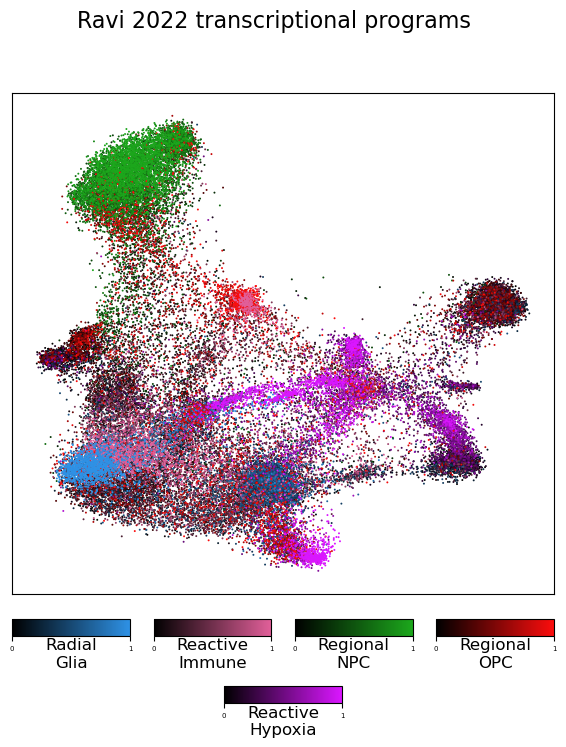

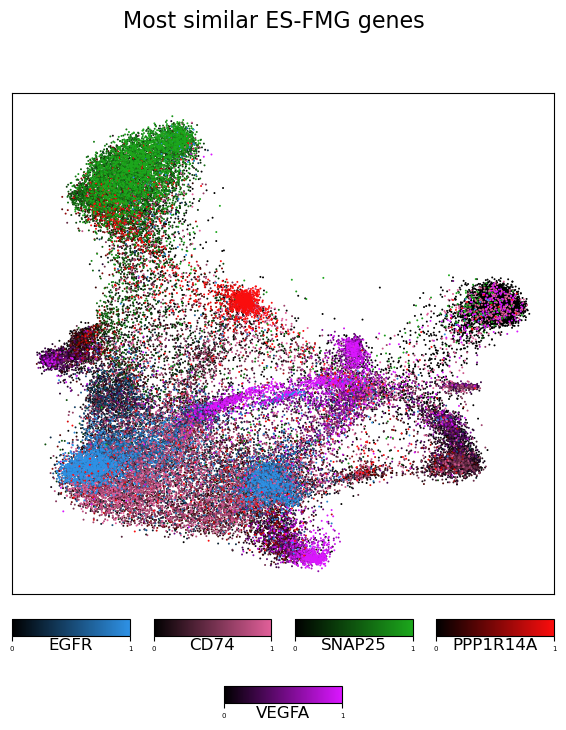

In [34]:
features = ['Radial\nGlia', 'Reactive\nImmune', 'Regional\nNPC', 'Regional\nOPC', 'Reactive\nHypoxia']
df1 = pd.DataFrame(np.asarray(adata.obs[features]),columns=features)

Plot_Genes = np.array(["EGFR","CD74","SNAP25","PPP1R14A","VEGFA"])
df2 = pd.DataFrame(np.asarray(adata[:, Plot_Genes].X.A),columns=Plot_Genes)

color_list = Colours[:Plot_Genes.shape[0]]

plot_feature_embedding(
    embedding=ES_UMAP_Embedding,
    features=features,
    dataframe=df1,
    colours=color_list,
    marker_size=2,  # match your original size
    percentile_clip=97.5,  # optional clipping
    scatter_width=2.33*3,  # similar to your (7,7) figsize
    scatter_height=2.6*3,
    label_pad=-10
)
plt.suptitle("Ravi 2022 transcriptional programs",fontsize=16)

plot_feature_embedding(
    embedding=ES_UMAP_Embedding,
    features=Plot_Genes,
    dataframe=df2,
    colours=color_list,
    marker_size=2,  # match your original size
    percentile_clip=97.5,  # optional clipping
    scatter_width=2.33*3,  # similar to your (7,7) figsize
    scatter_height=2.6*3,
    label_pad=-10
)
plt.suptitle("Most similar ES-FMG genes",fontsize=16)




In [35]:
### A provided function to plot gene expression profiles for a single gene across selected tumour samples

def Plot_ST_Grids(gene, sample_list=None, smoothed=False, n_cols=6, marker_size=30):
    """
    Plots spatial gene expression across multiple samples.

    Parameters:
        gene (str): Gene to plot.
        sample_list (list of str): Subset of samples to plot. If None, all samples.
        smoothed (bool): Use 'Smoothed_Expression' layer if True.
        n_cols (int): Number of subplot columns.
        marker_size (int or float): Size of hexagon markers.
    """
    import numpy as np
    import matplotlib.pyplot as plt

    all_samples = adata.obs['sample'].unique()
    samples = sample_list if sample_list is not None else all_samples
    samples = [s for s in samples if s in all_samples]

    n_samples = len(samples)
    n_rows = int(np.ceil(n_samples / n_cols))

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    fig.patch.set_facecolor('black')
    axs = axs.flatten()

    for i, sample in enumerate(samples):
        adata_sample = adata[adata.obs['sample'] == sample]
        coords = adata_sample.obsm['spatial']
        x, y = coords[:, 1], coords[:, 0]

        # Fixed axis limits for consistent spatial layout
        x_min, x_max = x.min(), x.max()
        y_min, y_max = y.min(), y.max()

        # Extract expression
        if gene in adata_sample.var_names:
            if smoothed:
                expr = adata_sample[:, gene].layers['Smoothed_Expression']
            else:
                expr = np.log2(adata_sample[:, gene].X.A + 1)
            expr = expr.toarray().flatten() if hasattr(expr, "toarray") else expr.flatten()
            # expr = np.clip(expr, 0, np.percentile(expr, 97.5))
            expr = np.clip(expr, np.min(expr), np.percentile(expr, 97.5))
        else:
            expr = np.zeros(adata_sample.shape[0])
            print(f"Warning: Gene '{gene}' not found in sample '{sample}'.")

        ax = axs[i]
        ax.set_facecolor('black')

        # --- Fix colormap scale: always vmin=0, even if all expr are 0
        vmax = np.max(expr)
        if vmax == 0:
            vmax = 1  # avoids division by zero, keeps 0 shown as blue

        sc = ax.scatter(
            x, y,
            c=expr,
            cmap='bwr',
            vmin=0,
            vmax=vmax,
            s=marker_size,
            marker='h',
            edgecolor='none'
        )

        # Lock axes before colorbar
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.invert_yaxis()
        ax.set_aspect('equal', adjustable='box')
        ax.axis('off')
        ax.set_title(sample, color='white', fontsize=16)

        # Colorbar
        cbar = fig.colorbar(sc, ax=ax, orientation='vertical', fraction=0.046, pad=0.02)
        cbar.set_label(gene, color='white', fontsize=10)
        cbar.ax.yaxis.set_tick_params(color='white')
        plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white', fontsize=8)

    # Turn off any unused axes
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')
        axs[j].set_facecolor('black')

    plt.suptitle(f"Spatial Expression of {gene}", fontsize=30, color='white')
    plt.tight_layout(rect=[0, 0, 1, 0.97])


In [36]:
### View available tumour IDS
print(np.unique(adata.obs["sample"]))

['#UKF242_T_ST' '#UKF243_T_ST' '#UKF248_T_ST' '#UKF251_T_ST'
 '#UKF255_T_ST' '#UKF256_TI_ST' '#UKF260_T_ST' '#UKF262_T_ST'
 '#UKF265_T_ST' '#UKF266_T_ST' '#UKF269_T_ST' '#UKF275_T_ST'
 '#UKF304_T_ST' '#UKF313_T_ST' '#UKF334_T_ST']


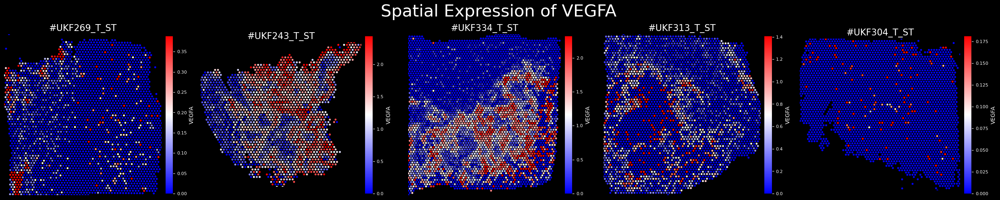

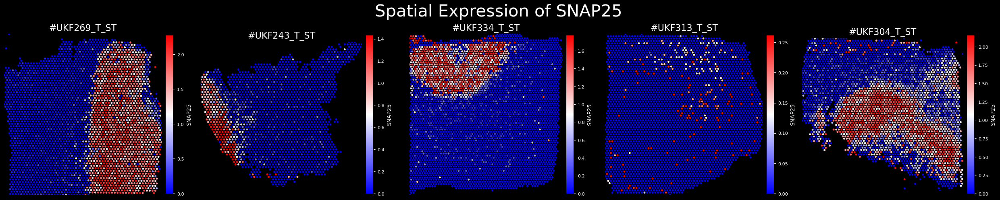

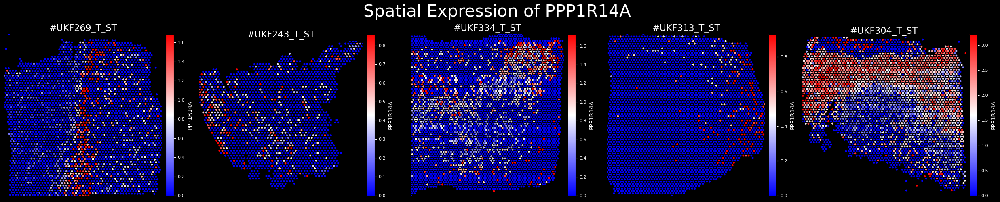

In [37]:
### Plot a particular gene in a particular set of tumours
Samples = np.array(['#UKF269_T_ST', '#UKF243_T_ST', '#UKF334_T_ST', '#UKF313_T_ST', '#UKF304_T_ST'])
Plot_Genes = np.array(["VEGFA","SNAP25","PPP1R14A"])
# Plot_Genes = np.array(["SNAP25"])

for i in np.arange(Plot_Genes.shape[0]):
    Plot_ST_Grids(Plot_Genes[i], sample_list=Samples,n_cols=Samples.shape[0], marker_size=15)

In [38]:
### A provided function to plot gene expression profiles for a multiple genes for a single tumour

def Plot_ST_Grids_By_Sample(sample, gene_list, smoothed=False, n_cols=6):
    """
    Plots spatial expression of multiple genes or obs features within a single sample.

    Parameters:
    - sample (str): The sample name to visualize.
    - gene_list (list or array-like): Genes or obs columns to visualize.
    - smoothed (bool): Whether to use smoothed expression (only applies to genes).
    - n_cols (int): Number of columns in the subplot grid.
    """
    # Validate sample
    all_samples = adata.obs['sample'].unique()
    if sample not in all_samples:
        raise ValueError(f"Sample '{sample}' not found in adata.obs['sample'].")

    # Subset to sample
    adata_sample = adata[adata.obs['sample'] == sample]
    coords = adata_sample.obsm['spatial']
    x, y = coords[:, 1], coords[:, 0]

    # Compute axis limits once
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()

    # Grid layout
    n_genes = len(gene_list)
    n_rows = int(np.ceil(n_genes / n_cols))

    # Create subplots
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    fig.patch.set_facecolor('black')
    axs = axs.flatten()

    for i, gene in enumerate(gene_list):
        ax = axs[i]
        ax.set_facecolor('black')

        # Determine source of expression data
        if gene in adata_sample.var_names:
            if smoothed:
                expr = adata_sample[:, gene].layers['Smoothed_Expression']
            else:
                expr = np.log2(adata_sample[:, gene].X.A + 1)
            expr = expr.toarray().flatten() if hasattr(expr, 'toarray') else expr.flatten()
        elif gene in adata_sample.obs.columns:
            expr = adata_sample.obs[gene].values
        else:
            expr = np.zeros(adata_sample.shape[0])
            print(f"Warning: '{gene}' not found in var_names or obs columns.")
        
        # Clip outliers
        expr = np.clip(expr, a_min=0, a_max=np.percentile(expr, 97.5))

        # Plot
        if np.min(expr) < np.max(expr):
            sc = ax.scatter(x, y, c=expr, cmap="bwr", s=10, edgecolor='none')
        else:
            sc = ax.scatter(x, y, c=expr, cmap="bwr", s=10, edgecolor='none')

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.invert_yaxis()
        ax.set_aspect('equal', adjustable='box')
        ax.axis('off')
        ax.set_title(gene, color='white', fontsize=16)

        # Add colorbar
        cbar = fig.colorbar(sc, ax=ax, orientation='vertical', fraction=0.046, pad=0.02)
        cbar.set_label(gene, color='white', fontsize=10)
        cbar.ax.yaxis.set_tick_params(color='white')
        plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white', fontsize=8)

    # Hide any unused subplots
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')
        axs[j].set_facecolor('black')

    plt.suptitle(f"Spatial Expression in Sample '{sample}'", fontsize=32, color='white')
    plt.tight_layout(rect=[0, 0, 1, 0.97])

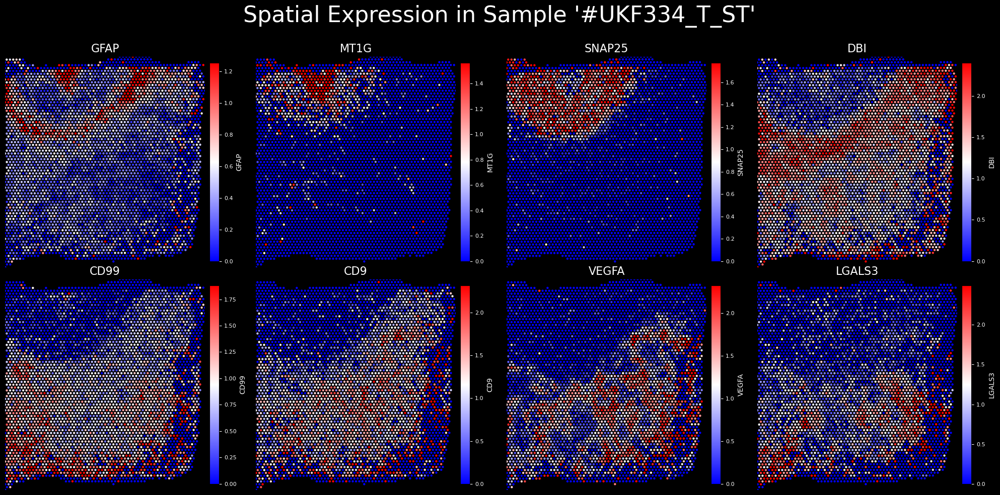

In [39]:
Sample = "#UKF334_T_ST"
Plot_Genes = np.asarray(["GFAP", "MT1G", "SNAP25", "DBI", "CD99", "CD9", "VEGFA", "LGALS3"])

Plot_ST_Grids_By_Sample(Sample, Plot_Genes,n_cols=4)

In [74]:
def plot_gene_spatial_embedding(
    sample, genes, adata, colours,
    percentile_clip=97.5,
    smoothed=True,
    marker_size=30,
    bars_per_col=4,
    colorbar_scale=1.0,
    colorbar_column_spacing=0.02,
    figsize=None,
    ax=None,
    show_colorbar=None
):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import to_rgba
    from matplotlib import colors as mcolors

    if sample not in adata.obs['sample'].unique():
        raise ValueError(f"Sample '{sample}' not found.")

    genes = np.array(genes, dtype=object)
    colours = np.array(colours, dtype=object)
    valid_mask = np.array([(g not in [None, "None", ""]) for g in genes])
    genes = genes[valid_mask]
    colours = colours[valid_mask]

    if len(genes) == 0:
        raise ValueError("All genes were None. Nothing to plot.")

    n_genes = len(genes)

    adata_sample = adata[adata.obs['sample'] == sample]
    coords = adata_sample.obsm['spatial']
    x, y = coords[:, 1], coords[:, 0]
    n_spots = adata_sample.shape[0]

    expr = np.zeros((n_genes, n_spots))
    for i, gene in enumerate(genes):
        if gene not in adata_sample.var_names:
            raise ValueError(f"Gene '{gene}' not found in sample '{sample}'.")
        if smoothed:
            e = adata_sample[:, gene].layers['Smoothed_Expression']
        else:
            e = np.log2(adata_sample[:, gene].X.A + 1)
        e = e.toarray().flatten() if hasattr(e, 'toarray') else e.flatten()
        e = np.clip(e, 0, np.percentile(e, percentile_clip))
        expr[i] = e

    expr_max = np.max(expr, axis=1, keepdims=True)
    expr_norm = expr / (expr_max + 1e-9)

    ranks = expr.argsort(axis=1).argsort(axis=1)
    prctl = ranks / (n_spots - 1)
    best_idx = prctl.argmax(axis=0)
    best_vals = expr_norm[best_idx, np.arange(n_spots)]
    best_colors = colours[best_idx]

    valid = expr.sum(axis=0) > 0
    x = x[valid]
    y = y[valid]
    best_vals = best_vals[valid]
    best_colors = best_colors[valid]

    def black_to_rgba(color, value):
        rgb = np.array(to_rgba(color))[:3]
        return np.concatenate([value * rgb, [1.0]])

    rgba = np.array([black_to_rgba(c, v) for c, v in zip(best_colors, best_vals)])

    order = np.argsort(best_vals)
    x = x[order]
    y = y[order]
    rgba = rgba[order]

    created_fig = False
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize or (6, 6))
        fig.patch.set_facecolor('black')
        created_fig = True
        show_colorbar = True if show_colorbar is None else show_colorbar
    else:
        show_colorbar = False if show_colorbar is None else show_colorbar

    ax.set_facecolor("black")
    ax.scatter(x, y, c=rgba, s=marker_size, marker='h', edgecolor='none')
    ax.set_xlim(x.min(), x.max())
    ax.set_ylim(y.min(), y.max())
    ax.invert_yaxis()
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(sample, fontsize=10, color='white')

    # --- Colorbar logic
    if show_colorbar:
        fig = ax.figure
        bbox = ax.get_position()

        # Derived layout info
        n_cols_cb = int(np.ceil(n_genes / bars_per_col))
        bar_width = 0.01 * colorbar_scale
        bar_spacing_x = colorbar_column_spacing * colorbar_scale
        spacing_y = 0.2

        # Total height of all bars + spacing
        bar_height = bbox.height / (bars_per_col + (bars_per_col - 1) * spacing_y)

        for col in range(n_cols_cb):
            start_idx = col * bars_per_col
            end_idx = min(start_idx + bars_per_col, n_genes)
            bar_subset = list(zip(genes[start_idx:end_idx], colours[start_idx:end_idx]))
            n_bars_this_col = len(bar_subset)

            actual_height = (
                n_bars_this_col * bar_height + (n_bars_this_col - 1) * spacing_y * bar_height
            )

            # Center vertically
            y_center = (bbox.y0 + bbox.y1) / 2
            y_top = y_center + actual_height / 2

            for row, (gene, color) in enumerate(bar_subset):
                # Position just to the right of the subplot
                x0 = bbox.x1 + 0.01 + col * (bar_width + bar_spacing_x)
                y0 = y_top - (row + 1) * bar_height - row * spacing_y * bar_height

                ax_cb = fig.add_axes([x0, y0, bar_width, bar_height])
                cmap = mcolors.LinearSegmentedColormap.from_list(f"{gene}_cmap", ["black", color])
                norm = mcolors.Normalize(vmin=0, vmax=1)
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
                sm.set_array([])

                cb = fig.colorbar(sm, cax=ax_cb)
                cb.set_ticks([0, 1])
                cb.set_ticklabels(["0", "1"])
                cb.ax.set_ylabel(gene, rotation=270, labelpad=-5, fontsize=6, color='white')
                cb.ax.tick_params(labelsize=6)
                cb.outline.set_edgecolor('white')
                cb.ax.yaxis.set_tick_params(color='white')
                plt.setp(cb.ax.get_yticklabels(), color='white')

    return ax


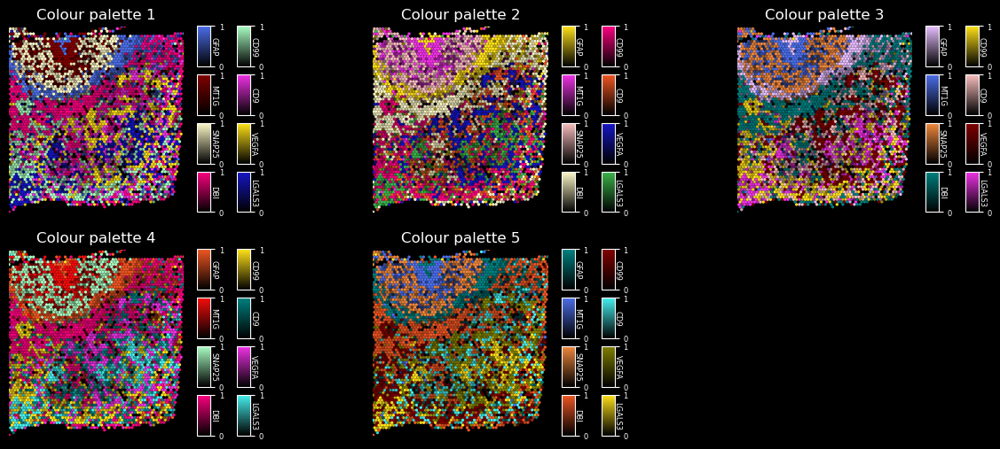

In [89]:
# Parameters
n_plots = 5
n_cols = 3  # Choose how many columns you want
n_rows = int(np.ceil(n_plots / n_cols))

# Set up the figure and axes
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5 * n_cols, 3 * n_rows))
fig.patch.set_facecolor('black')
axes = axes.flatten()  # Flatten in case of multiple rows

# A custom color palette
base_color_list = np.array([
    '#911eb4', '#3cb44b', '#FC0080', '#f0883d', '#fffac8', '#ffe119',
    '#fabebe', '#1616C6', '#f032e6', '#f40d0d', '#aaffc3', '#F05623',
    '#bcf60c', '#edbe8f', '#008080', '#808000', '#46f0f0', '#800000',
    '#e6beff', '#4c6ee8'
])

Plot_Genes = np.asarray(["GFAP", "MT1G", "SNAP25", "DBI", "CD99", "CD9", "VEGFA", "LGALS3"])
Sample = "#UKF334_T_ST"

for i in range(n_plots):
    np.random.shuffle(base_color_list)
    color_list = base_color_list[:Plot_Genes.shape[0]]

    ax = axes[i]

    # Assuming your function accepts an `ax` parameter
    plot_gene_spatial_embedding(
        sample=Sample,
        genes=Plot_Genes,
        adata=adata,
        colours=color_list,
        smoothed=False,
        marker_size=7,
        ax=ax,
        show_colorbar=True,
        colorbar_column_spacing=0.02
    )
    ax.set_title(f"Colour palette {i+1}")

# Remove unused axes
for j in range(n_plots, len(axes)):
    fig.delaxes(axes[j])

# plt.tight_layout()
plt.show()